# Heart Disease

# 1 Data Preprocessing

## 1.1 Importing the required library

Necessary libraries includes for model implementation and data processing

In [1]:
# Essentials
import numpy as np
import pandas as pd
import random

# Plots
import seaborn as sns
import matplotlib.pyplot as plt

# Models sklearn
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier 
from sklearn.ensemble import AdaBoostClassifier

# Misc
from sklearn.model_selection import GridSearchCV
from sklearn.tree import export_graphviz 
from sklearn.model_selection import train_test_split 
from sklearn.metrics import confusion_matrix 
from sklearn.metrics import roc_curve, auc 
from sklearn.metrics import classification_report 
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, roc_auc_score

# Ignore useless warnings
import warnings
warnings.filterwarnings(action="ignore")

## 1.2 Importing the Dataset

The dataset source is from the UCI Machine Learning Repository. It has 303 records, of which 139 has heart disease, and the rate of illness is 45.87%. Although there are as many as 76 attributes in this database, only a subset of them are selected.

In [2]:
# Read in the dataset as a dataframe
dt = pd.read_csv("heart.csv")

<h3>Dataset Columns</h3>
<ul>
    <li>Age (age in years)</li>
    <li>Sex (1 = male; 0 = female)</li>
    <li>CP (chest pain type,  Value 1: typical angina, Value 2: atypical angina, Value 3: non-anginal pain, Value 4: asymptomatic)</li>
    <li>TRESTBPS (resting blood pressure (in mm Hg on admission to the hospital))</li>
    <li>CHOL (serum cholestoral in mg/dl)</li>
    <li>FPS (fasting blood sugar > 120 mg/dl) (1 = true; 0 = false)</li>
    <li>RESTECH (resting electrocardiographic results, 0 = normal, 1 = having ST-T wave abnormality, 2 = showing probable or definite left ventricular hypertrophy by Estes' criteria)</li>
    <li>THALACH (maximum heart rate achieved)</li>
    <li>EXANG (exercise induced angina (1 = yes; 0 = no))</li>
    <li>OLDPEAK (ST depression induced by exercise relative to rest)</li>
    <li>SLOPE (the slope of the peak exercise ST segment, Value 1: upsloping, Value 2: flat, Value 3: downsloping)</li>
    <li>CA (number of major vessels (0-3) colored by flourosopy)</li>
    <li>THAL (A blood disorder called thalassemia, 3 = normal; 6 = fixed defect; 7 = reversable defect)</li>
    <li>TARGET (1 = yes; 0 = no)</li>
</ul>

## 1.3 Handling the missing data

In [3]:
# First 5 rows
dt.head(10)
# data.tail()
# data.columns  Index(['age', 'sex', 'cp', 'trestbps', 'chol', 'fbs', 'restecg', 'thalach', 'exang', 'oldpeak', 'slope', 'ca', 'thal', 'target'], dtype='object')
# data.shape  (303, 14)

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
5,57,1,0,140,192,0,1,148,0,0.4,1,0,1,1
6,56,0,1,140,294,0,0,153,0,1.3,1,0,2,1
7,44,1,1,120,263,0,1,173,0,0.0,2,0,3,1
8,52,1,2,172,199,1,1,162,0,0.5,2,0,3,1
9,57,1,2,150,168,0,1,174,0,1.6,2,0,2,1


In [4]:
# no missing data
dt.isnull().sum()

age         0
sex         0
cp          0
trestbps    0
chol        0
fbs         0
restecg     0
thalach     0
exang       0
oldpeak     0
slope       0
ca          0
thal        0
target      0
dtype: int64

## 1.4 Encoding categorical data

In [5]:
# change the column name
dt.columns = ['age', 'sex', 'chest_pain_type', 'resting_blood_pressure', 'cholesterol', 'fasting_blood_sugar', 'rest_ecg', 'max_heart_rate',
       'exercise_induced_angina', 'st_depression', 'st_slope', 'num_major_vessels', 'thalassemia', 'target']

In [6]:
# categorical variable
dt['sex'][dt['sex'] == 0] = 'female'
dt['sex'][dt['sex'] == 1] = 'male'
dt['sex'] = dt['sex'].astype('object')

dt['chest_pain_type'][dt['chest_pain_type'] == 1] = 'typical angina'
dt['chest_pain_type'][dt['chest_pain_type'] == 2] = 'atypical angina'
dt['chest_pain_type'][dt['chest_pain_type'] == 3] = 'non-anginal pain'
dt['chest_pain_type'][dt['chest_pain_type'] == 4] = 'asymptomatic'
dt['chest_pain_type'] = dt['chest_pain_type'].astype('object')

dt['fasting_blood_sugar'][dt['fasting_blood_sugar'] == 0] = 'lower than 120mg/ml'
dt['fasting_blood_sugar'][dt['fasting_blood_sugar'] == 1] = 'greater than 120mg/ml'
dt['fasting_blood_sugar'] = dt['fasting_blood_sugar'].astype('object')

dt['rest_ecg'][dt['rest_ecg'] == 0] = 'normal'
dt['rest_ecg'][dt['rest_ecg'] == 1] = 'ST-T wave abnormality'
dt['rest_ecg'][dt['rest_ecg'] == 2] = 'left ventricular hypertrophy'
dt['rest_ecg'] = dt['rest_ecg'].astype('object')

dt['exercise_induced_angina'][dt['exercise_induced_angina'] == 0] = 'no'
dt['exercise_induced_angina'][dt['exercise_induced_angina'] == 1] = 'yes'
dt['exercise_induced_angina'] = dt['exercise_induced_angina'].astype('object')

dt['st_slope'][dt['st_slope'] == 1] = 'upsloping'
dt['st_slope'][dt['st_slope'] == 2] = 'flat'
dt['st_slope'][dt['st_slope'] == 3] = 'downsloping'
dt['st_slope'] = dt['st_slope'].astype('object')

dt['thalassemia'][dt['thalassemia'] == 1] = 'normal'
dt['thalassemia'][dt['thalassemia'] == 2] = 'fixed defect'
dt['thalassemia'][dt['thalassemia'] == 3] = 'reversable defect'
dt['thalassemia'] = dt['thalassemia'].astype('object')

dt.dtypes # check types

age                          int64
sex                         object
chest_pain_type             object
resting_blood_pressure       int64
cholesterol                  int64
fasting_blood_sugar         object
rest_ecg                    object
max_heart_rate               int64
exercise_induced_angina     object
st_depression              float64
st_slope                    object
num_major_vessels            int64
thalassemia                 object
target                       int64
dtype: object

In [7]:
# creating dummy variable, one-hot code
dt = pd.get_dummies(dt, drop_first=True)

In [8]:
dt.head()

,age,resting_blood_pressure,cholesterol,max_heart_rate,st_depression,num_major_vessels,target,sex_male,chest_pain_type_atypical angina,chest_pain_type_non-anginal pain,chest_pain_type_typical angina,fasting_blood_sugar_lower than 120mg/ml,rest_ecg_left ventricular hypertrophy,rest_ecg_normal,exercise_induced_angina_yes,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect
0,63,145,233,150,2.3,0,1,1,0,1,0,0,0,1,0,0,0,0,1,0
1,37,130,250,187,3.5,0,1,1,1,0,0,1,0,0,0,0,0,1,0,0
2,41,130,204,172,1.4,0,1,0,0,0,1,1,0,1,0,1,0,1,0,0
3,56,120,236,178,0.8,0,1,1,0,0,1,1,0,0,0,1,0,1,0,0
4,57,120,354,163,0.6,0,1,0,0,0,0,1,0,0,1,1,0,1,0,0


## 1.5 Split the dataset

Because probabilistic models (such as tree models) do not need to be normalized because they care about the distribution of variables and the conditional probabilities between variables, such as Decision Trees, Random Forest. Machine learning algorithms like Naive Bayes, Logistic Regression, SVM, and KNN need to be normalized. High magnitudes features have a  heavier weight than low magnitudes features, which leads to imbalance results.

In [9]:
x = dt.drop('target', 1)
y = dt['target']

# split the data
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state=1) 

In [10]:
x_train.head()

,age,resting_blood_pressure,cholesterol,max_heart_rate,st_depression,num_major_vessels,sex_male,chest_pain_type_atypical angina,chest_pain_type_non-anginal pain,chest_pain_type_typical angina,fasting_blood_sugar_lower than 120mg/ml,rest_ecg_left ventricular hypertrophy,rest_ecg_normal,exercise_induced_angina_yes,st_slope_flat,st_slope_upsloping,thalassemia_fixed defect,thalassemia_normal,thalassemia_reversable defect
62,52,118,186,190,0.0,0,1,0,1,0,1,0,1,0,0,1,0,1,0
127,67,152,277,172,0.0,1,0,1,0,0,1,0,0,0,1,0,1,0,0
111,57,150,126,173,0.2,1,1,1,0,0,0,0,0,0,1,0,0,0,1
287,57,154,232,164,0.0,1,1,0,0,1,1,0,1,0,1,0,1,0,0
108,50,120,244,162,1.1,0,0,0,0,1,1,0,0,0,1,0,1,0,0


## 1.6 Feature Scaling

In [11]:
scaler = StandardScaler()
x_scaler_train = pd.DataFrame(scaler.fit_transform(x_train))
x_scaler_test = pd.DataFrame(scaler.fit_transform(x_test))

In [12]:
x_scaler_train.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18
0,-0.270906,-0.770147,-1.174488,1.721500,-0.933529,-0.724286,0.663684,-0.637947,3.527668,-0.464844,0.418040,-0.112037,1.050880,-0.68313,-0.951584,1.086361,-1.151921,4.035556,-0.755929
1,1.370810,1.186855,0.595846,0.955920,-0.933529,0.271607,-1.506742,1.567528,-0.283473,-0.464844,0.418040,-0.112037,-0.951584,-0.68313,1.050880,-0.920504,0.868115,-0.247797,-0.755929
2,0.276333,1.071737,-2.341741,0.998453,-0.751046,0.271607,0.663684,1.567528,-0.283473,-0.464844,-2.392117,-0.112037,-0.951584,-0.68313,1.050880,-0.920504,-1.151921,-0.247797,1.322876
3,0.276333,1.301972,-0.279594,0.615663,-0.933529,0.271607,0.663684,-0.637947,-0.283473,2.151257,0.418040,-0.112037,1.050880,-0.68313,1.050880,-0.920504,0.868115,-0.247797,-0.755929
4,-0.489801,-0.655030,-0.046143,0.530598,0.070128,-0.724286,-1.506742,-0.637947,-0.283473,2.151257,0.418040,-0.112037,-0.951584,-0.68313,1.050880,-0.920504,0.868115,-0.247797,-0.755929


# 2 Model

## 2.1 Naive Bayes

In [13]:
nb = GaussianNB()
nb.fit(x_train, y_train)
# y_pred_nb = nb.predict( x_test ) # array([0, 0, 0, 1, 0, ...]
nb_score = nb.score(x_test,y_test) # accuracy_score(y_pred_nb,y_test)

print('Naive Bayes Accuracy: ', round(nb_score, 5)*100, '%')

Naive Bayes Accuracy:  78.689 %


## 2.2 Logistic Regression

In [14]:
lr = LogisticRegression()
lr.fit(x_scaler_train, y_train)
lr_score = lr.score(x_scaler_test, y_test)
print('Logistic Regression Accuracy: ', round(lr_score, 5)*100, '%')

Logistic Regression Accuracy:  77.049 %


## 2.3 KNN

In [15]:
# set k=2
knn2 = KNeighborsClassifier(n_neighbors = 2) 
knn2.fit(x_scaler_train, y_train)
knn2_score = knn2.score(x_scaler_test, y_test)
print('2NN Accuracy: ', round(knn2_score, 5)*100, '%')

2NN Accuracy:  70.492 %


In [16]:
# find best k v
knn_scores = [] 
for i in range(1,21):
    knn_classifier = KNeighborsClassifier(n_neighbors = i)  
    knn_classifier.fit(x_scaler_train, y_train)
    knn_scores.append(knn_classifier.score(x_scaler_test, y_test))
knn_scores = [round(i,2) for i in knn_scores] # [0.52, 0.59, 0.64,...]
# knn_scores

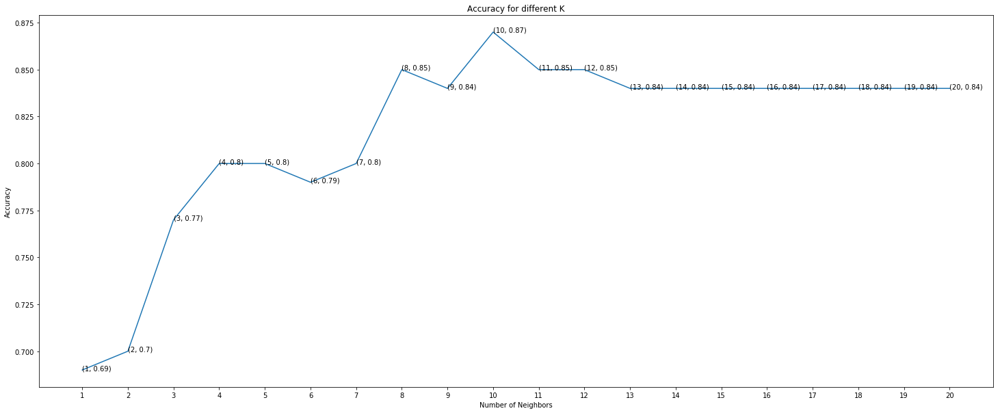

In [17]:
plt.figure(figsize=(25,10))
plt.plot(range(1,21), knn_scores)
for i in range(1,21):
    plt.text(i, knn_scores[i-1], (i,knn_scores[i-1]))
plt.xticks(np.arange(1,21,1))
plt.xlabel("Number of Neighbors")
plt.ylabel("Accuracy")
plt.title('Accuracy for different K')
plt.show()

In [18]:
knn = KNeighborsClassifier(n_neighbors = 10) 
knn.fit(x_scaler_train, y_train)
knn_score = knn.score(x_scaler_test, y_test)
print('Maximum KNN Accuracy: ', round(knn_score, 2)*100, '%') # 10

Maximum KNN Accuracy:  87.0 %


## 2.4 SVM

In [19]:
# fine best kernel
svc_scores = []
kernels = ['linear', 'poly', 'rbf', 'sigmoid']
for i in range(len(kernels)):
    svc_classifier = SVC(kernel = kernels[i])
    svc_classifier.fit(x_scaler_train, y_train)
    svc_scores.append(svc_classifier.score(x_scaler_test, y_test))
svc_scores

[0.8032786885245902,
 0.7540983606557377,
 0.7704918032786885,
 0.7868852459016393]

In [20]:
svm = SVC(random_state = 1, probability=True, kernel='linear')
svm.fit(x_scaler_train, y_train)
svm_score = svm.score(x_scaler_test, y_test)
print('SVM Accuracy: ', round(svm_score, 5)*100, '%')

SVM Accuracy:  80.328 %


## 2.5 Decision Tree

In [21]:
dtc = DecisionTreeClassifier()
dtc.fit(x_train, y_train)
dtc_score = dtc.score(x_test, y_test)
print('Decision Tree Accuracy: ', round(dtc_score, 5)*100, '%')

Decision Tree Accuracy:  72.131 %


## 2.6 Random Forest

In [24]:
# random forest
rfc = RandomForestClassifier(max_depth=5)
rfc.fit(x_train, y_train)
rfc_score = rfc.score(x_test, y_test)
print('Random Forest Accuracy: ', round(rfc_score, 5)*100, '%')

Random Forest Accuracy:  83.607 %


In [25]:
# plot tree

# y_train 
y_train_d = y_train.astype('str')
y_train_d[y_train_d == '0'] = 'no disease'
y_train_d[y_train_d == '1'] = 'disease'
y_train_d = y_train_d.values

# Extract single tree
estimator = rfc.estimators_[5] # 1

# Export as dot file
export_graphviz(estimator, out_file='tree1.dot', 
                feature_names = [i for i in dt.drop('target', 1).columns],
                class_names = y_train_d,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree1.dot', '-o', 'tree1.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree1.png')

In [26]:
# save the model
from sklearn.externals import joblib
joblib.dump(rfc, "rf.m", protocol=2)

clf = joblib.load("rf.m")

kk = x_test.iloc[[0]]
kkk = [[0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0]]
pre = clf.predict(kk)
pre

array([0])

In [27]:
x_test.dtypes

age                                          int64
resting_blood_pressure                       int64
cholesterol                                  int64
max_heart_rate                               int64
st_depression                              float64
num_major_vessels                            int64
sex_male                                     uint8
chest_pain_type_atypical angina              uint8
chest_pain_type_non-anginal pain             uint8
chest_pain_type_typical angina               uint8
fasting_blood_sugar_lower than 120mg/ml      uint8
rest_ecg_left ventricular hypertrophy        uint8
rest_ecg_normal                              uint8
exercise_induced_angina_yes                  uint8
st_slope_flat                                uint8
st_slope_upsloping                           uint8
thalassemia_fixed defect                     uint8
thalassemia_normal                           uint8
thalassemia_reversable defect                uint8
dtype: object

## 2.7 AdaBoost

In [28]:
ada = AdaBoostClassifier()
ada.fit(x_train, y_train)  
ada_score = ada.score(x_test, y_test)
print('AdaBoost Accuracy: ', round(ada_score, 5)*100, '%')

AdaBoost Accuracy:  75.41 %


## 2.8 Nerual Network

In [29]:
from keras.models import Sequential
from keras.layers import Dense
from keras.optimizers import Adam

# define a function to build the keras model
def create_model():
    # create model
    model = Sequential()
    model.add(Dense(16, input_dim=19, kernel_initializer='normal', activation='relu'))
    model.add(Dense(8, kernel_initializer='normal', activation='relu'))
    model.add(Dense(2, activation='softmax'))
    
    # compile model
    adam = Adam(lr=0.001)
    model.compile(loss='categorical_crossentropy', optimizer=adam, metrics=['accuracy'])
    return model

nn = create_model()

print(nn.summary())

Using TensorFlow backend.


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 16)                320       
_________________________________________________________________
dense_2 (Dense)              (None, 8)                 136       
_________________________________________________________________
dense_3 (Dense)              (None, 2)                 18        
Total params: 474
Trainable params: 474
Non-trainable params: 0
_________________________________________________________________
None


In [30]:
# convert the data to categorical labels
from keras.utils.np_utils import to_categorical

Y_train = to_categorical(y_train, num_classes=None)
Y_test = to_categorical(y_test, num_classes=None)
print (Y_train.shape)
print (Y_train[:10])

(242, 2)
[[0. 1.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [0. 1.]
 [1. 0.]
 [0. 1.]
 [1. 0.]
 [0. 1.]]


In [36]:
# fit the model to the training data
history=nn.fit(x_train, Y_train, validation_data=(x_test, Y_test),epochs=200, batch_size=10, verbose = 10)

Train on 242 samples, validate on 61 samples
Epoch 1/200
Epoch 2/200
Epoch 3/200
Epoch 4/200
Epoch 5/200
Epoch 6/200
Epoch 7/200
Epoch 8/200
Epoch 9/200
Epoch 10/200
Epoch 11/200
Epoch 12/200
Epoch 13/200
Epoch 14/200
Epoch 15/200
Epoch 16/200
Epoch 17/200
Epoch 18/200
Epoch 19/200
Epoch 20/200
Epoch 21/200
Epoch 22/200
Epoch 23/200
Epoch 24/200
Epoch 25/200
Epoch 26/200
Epoch 27/200
Epoch 28/200
Epoch 29/200
Epoch 30/200
Epoch 31/200
Epoch 32/200
Epoch 33/200
Epoch 34/200
Epoch 35/200
Epoch 36/200
Epoch 37/200
Epoch 38/200
Epoch 39/200
Epoch 40/200
Epoch 41/200
Epoch 42/200
Epoch 43/200
Epoch 44/200
Epoch 45/200
Epoch 46/200
Epoch 47/200
Epoch 48/200
Epoch 49/200
Epoch 50/200
Epoch 51/200
Epoch 52/200
Epoch 53/200
Epoch 54/200
Epoch 55/200
Epoch 56/200
Epoch 57/200
Epoch 58/200
Epoch 59/200
Epoch 60/200
Epoch 61/200
Epoch 62/200
Epoch 63/200
Epoch 64/200
Epoch 65/200
Epoch 66/200
Epoch 67/200
Epoch 68/200
Epoch 69/200
Epoch 70/200
Epoch 71/200
Epoch 72/200
Epoch 73/200
Epoch 74/200
Ep

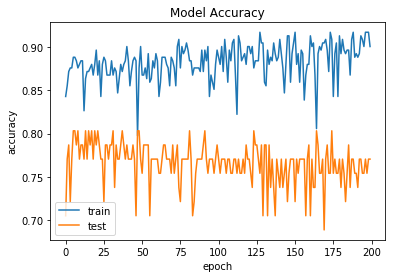

In [37]:
import matplotlib.pyplot as plt
%matplotlib inline
# Model accuracy
plt.plot(history.history['acc'])
plt.plot(history.history['val_acc'])
plt.title('Model Accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'test'])
plt.show()

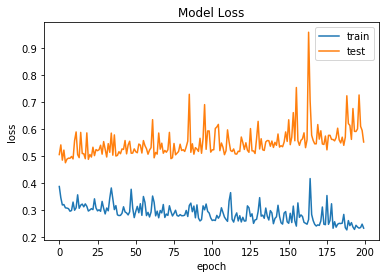

In [38]:
# Model Losss
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'])
plt.show()

In [39]:
# 3. Compare the Model
y_nn_predict = np.argmax(nn.predict(x_test), axis=1)
nn_score = accuracy_score(y_test, y_nn_predict)
print('Nerual Network Accuracy: ', round(nn_score, 5)*100, '%')

Nerual Network Accuracy:  77.049 %


In [40]:
y_nn_predict

array([0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0])

# 3. Compare the Model

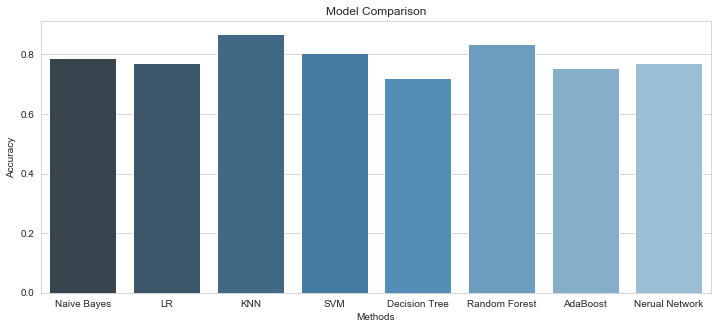

In [41]:
x_tick = ["Naive Bayes", "LR", "KNN", "SVM", "Decision Tree", "Random Forest","AdaBoost", "Nerual Network"]
y_tick = [nb_score, lr_score, knn_score, svm_score, dtc_score, rfc_score, ada_score, nn_score]

sns.set_style("whitegrid")
plt.figure(figsize=(12,5))
plt.title('Model Comparison')
plt.xlabel("Methods")
plt.ylabel("Accuracy")
sns.barplot(x=x_tick, y=y_tick, palette="Blues_d")
plt.show()

## Confusion matrix

Sensitivity = TP/(TP+FN) 
Specificity = TN/(FP+TN)  
Positive predictive value (PPV) = TP/(TP+FP)  
Negative predictive value (NPV) = TN/(FN+TN)  
Accuracy = (TP+TN)/(TP+TN+FP+FN)

In [42]:
y_lr_predict = lr.predict(x_test)
y_nb_predict = nb.predict(x_test)
y_knn_predict = knn.predict(x_test)
y_svm_predict = svm.predict(x_test)
y_dtc_predict = dtc.predict(x_test)
y_rfc_predict = rfc.predict(x_test)
y_ada_predict = ada.predict(x_test)
y_nn_predict = np.argmax(nn.predict(x_test), axis=1)

In [43]:
y_nn_predict

array([0, 1, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0, 1, 0, 1, 0,
       1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 1, 1, 0, 1, 0, 0])

In [44]:
cm_lr = confusion_matrix(y_test,y_lr_predict)
cm_nb = confusion_matrix(y_test,y_nb_predict)
cm_knn = confusion_matrix(y_test,y_knn_predict)
cm_svm = confusion_matrix(y_test,y_svm_predict)
cm_dtc = confusion_matrix(y_test,y_dtc_predict)
cm_rfc = confusion_matrix(y_test,y_rfc_predict)
cm_ada = confusion_matrix(y_test,y_ada_predict)
cm_nn = confusion_matrix(y_test,y_nn_predict)

In [45]:
cm_nn

array([[22,  8],
       [ 6, 25]])

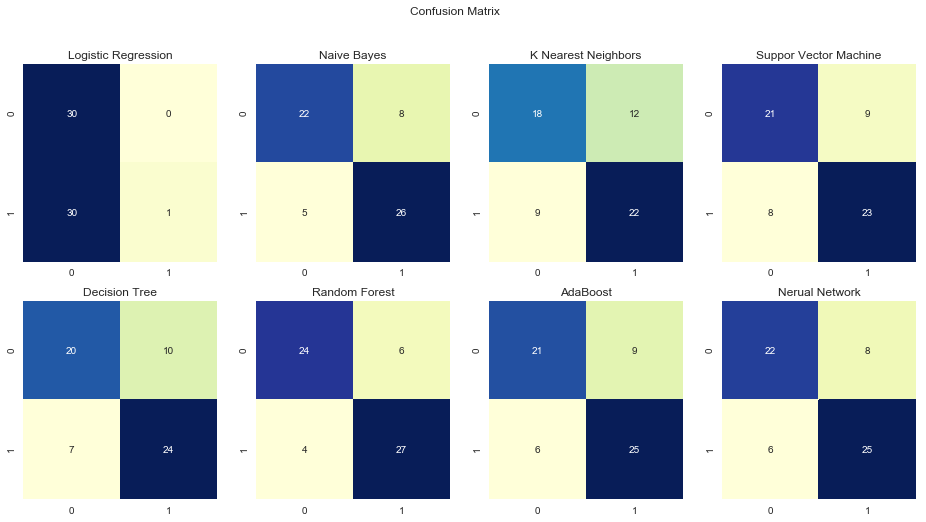

In [46]:
plt.figure(figsize=(16,8))

plt.suptitle("Confusion Matrix")

plt.subplot(2,4,1)
plt.title("Logistic Regression")
sns.heatmap(cm_lr,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,2)
plt.title("Naive Bayes")
sns.heatmap(cm_nb,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,3)
plt.title("K Nearest Neighbors")
sns.heatmap(cm_knn,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,4)
plt.title("Suppor Vector Machine")
sns.heatmap(cm_svm,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,5)
plt.title("Decision Tree")
sns.heatmap(cm_dtc,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,6)
plt.title("Random Forest")
sns.heatmap(cm_rfc,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,7)
plt.title("AdaBoost")
sns.heatmap(cm_ada,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.subplot(2,4,8)
plt.title("Nerual Network")
sns.heatmap(cm_nn,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

plt.show()

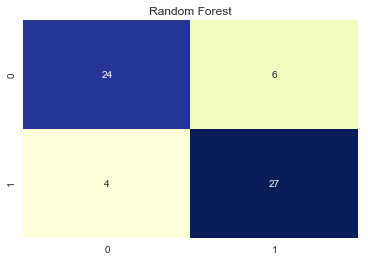

In [47]:
plt.title("Random Forest")
sns.heatmap(cm_rfc,annot=True,cmap="YlGnBu",fmt="g",cbar=False)

In [48]:
# sensitivity, recall, or true positive rate (TPR)
tpr_lr = cm_lr[0,0] / (cm_lr[0,0] + cm_lr[1,0]) # TP / (TP+FN)
tpr_nb = cm_nb[0,0] / (cm_nb[0,0] + cm_nb[1,0]) 
tpr_knn = cm_knn[0,0] / (cm_knn[0,0] + cm_knn[1,0]) 
tpr_svm = cm_svm[0,0] / (cm_svm[0,0] + cm_svm[1,0]) 
tpr_dtc = cm_dtc[0,0] / (cm_dtc[0,0] + cm_dtc[1,0]) 
tpr_rfc = cm_rfc[0,0] / (cm_rfc[0,0] + cm_rfc[1,0]) 
tpr_ada = cm_ada[0,0] / (cm_ada[0,0] + cm_ada[1,0]) 
tpr_nn = cm_nn[0,0] / (cm_nn[0,0] + cm_nn[1,0]) 

In [49]:
# sensitivity, recall, or true positive rate (TPR)
tpr_rfc = cm_rfc[0,0] / (cm_rfc[0,0] + cm_rfc[1,0]) 
tpr_rfc

0.8571428571428571

## ROC 

In [50]:
fpr_nb, tpr_nb, thresholds_nb = roc_curve(y_test, nb.predict_proba(x_test)[:,1])
fpr_lr,   tpr_lr,  thresholds_lr   = roc_curve(y_test, lr.predict_proba(x_test)[:,1])
fpr_knn, tpr_knn, thresholds_knn = roc_curve(y_test, knn.predict_proba(x_test)[:,1])
fpr_svm, tpr_svm, thresholds_svm = roc_curve(y_test, svm.predict_proba(x_test)[:,1])
fpr_dtc, tpr_dtc, thresholds_dtc = roc_curve(y_test, dtc.predict_proba(x_test)[:,1])
fpr_rfc, tpr_rfc, thresholds_rfc = roc_curve(y_test, rfc.predict_proba(x_test)[:,1])
fpr_ada, tpr_ada, thresholds_ada = roc_curve(y_test, ada.predict_proba(x_test)[:,1])
fpr_nn, tpr_nn, thresholds_nn = roc_curve(y_test, nn.predict_proba(x_test)[:,1])

In [51]:
# Area under curve
roc_auc_nb = round(auc(fpr_nb, tpr_nb),3)
roc_auc_lr =round(auc(fpr_lr,   tpr_lr),3)
roc_auc_knn = round(auc(fpr_knn, tpr_knn),3)
roc_auc_svm = round(auc(fpr_svm, tpr_svm),3)
roc_auc_dtc = round(auc(fpr_dtc, tpr_dtc),3)
roc_auc_rfc = round(auc(fpr_rfc, tpr_rfc),3)
roc_auc_ada = round(auc(fpr_ada, tpr_ada),3)
roc_auc_nn = round(auc(fpr_nn, tpr_nn),3)

print('Naive Bayes AUC: ', roc_auc_nb)
print('Logistic Regression AUC: ', roc_auc_lr)
print('KNN AUC: ', roc_auc_knn)
print('SVM AUC: ', roc_auc_svm)
print('Decision Tree AUC: ', roc_auc_dtc)
print('Random Forest AUC: ', roc_auc_rfc)
print('Adaboost AUC: ', roc_auc_ada)
print('Nerual Network AUC: ', roc_auc_nn)

Naive Bayes AUC:  0.819
Logistic Regression AUC:  0.682
KNN AUC:  0.669
SVM AUC:  0.742
Decision Tree AUC:  0.72
Random Forest AUC:  0.898
Adaboost AUC:  0.79
Nerual Network AUC:  0.858


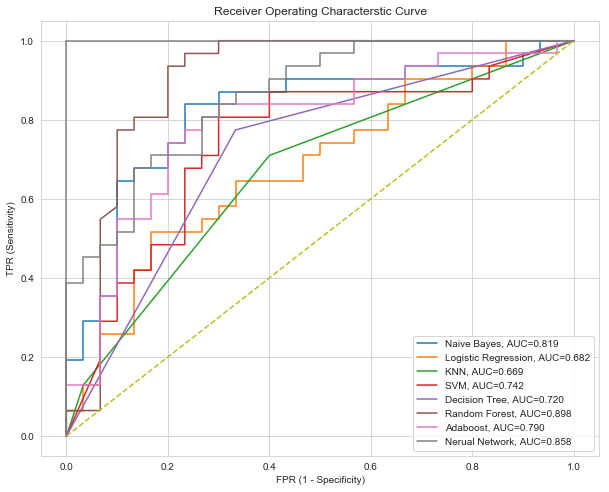

In [52]:
# plot roc curve

plt.figure(figsize=(10,8))
plt.grid(True)

plt.plot(fpr_nb, tpr_nb, label='Naive Bayes, AUC=%0.3f' % roc_auc_nb)
plt.plot(fpr_lr, tpr_lr, label='Logistic Regression, AUC=%0.3f' % roc_auc_lr)
plt.plot(fpr_knn, tpr_knn, label='KNN, AUC=%0.3f' % roc_auc_knn)
plt.plot(fpr_svm, tpr_svm, label='SVM, AUC=%0.3f' % roc_auc_svm)
plt.plot(fpr_dtc, tpr_dtc, label='Decision Tree, AUC=%0.3f' % roc_auc_dtc)
plt.plot(fpr_rfc, tpr_rfc, label='Random Forest, AUC=%0.3f' % roc_auc_rfc)
plt.plot(fpr_ada, tpr_ada, label='Adaboost, AUC=%0.3f' % roc_auc_ada)
plt.plot(fpr_nn, tpr_nn, label='Nerual Network, AUC=%0.3f' % roc_auc_nn)

plt.plot([0,1], ls='--')
plt.plot([0, 0], [1, 0], c=".5")
plt.plot([1,1], c='.5')

plt.title('Receiver Operating Characterstic Curve')
plt.xlabel('FPR (1 - Specificity)')
plt.ylabel('TPR (Sensitivity)')
plt.legend()
plt.show()

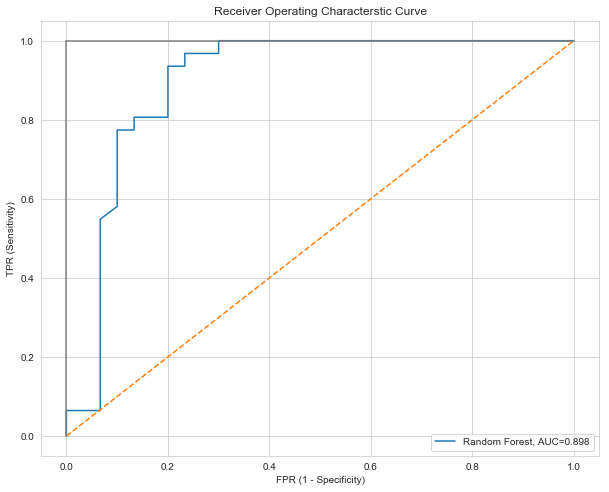

In [53]:
plt.figure(figsize=(10,8))
plt.grid(True)


plt.plot(fpr_rfc, tpr_rfc, label='Random Forest, AUC=%0.3f' % roc_auc_rfc)

plt.plot([0,1], ls='--')
plt.plot([0, 0], [1, 0], c=".5")
plt.plot([1,1], c='.5')

plt.title('Receiver Operating Characterstic Curve')
plt.xlabel('FPR (1 - Specificity)')
plt.ylabel('TPR (Sensitivity)')
plt.legend()
plt.show()

In [54]:
thresholds_rfc

array([1.97634824, 0.97634824, 0.95809757, 0.95671726, 0.8972766 ,
       0.8920845 , 0.83418774, 0.82112609, 0.73702339, 0.70621773,
       0.68130125, 0.60473676, 0.47285997, 0.47200855, 0.44689076,
       0.41126207, 0.36898763, 0.03738095, 0.00692308, 0.005     ])

## AUC

As a rule of thumb, an AUC of 0.85 or over is generally considered to be a good fit, whilst an AUC of 0.9 or over is very good. The ROC curve for the training data nearly always has a higher AUC than that for the test data.

# 4. Conclusion

## 4.1 Understand Data

By taking a glimpse of  the dataset, it is straightforward to find that most features are generally classified, which means that the other features need to be integrated. 

In [55]:
data = pd.read_csv("heart.csv")

In [56]:
data.describe()

,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
count,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000,303.000000
mean,54.366337,0.683168,0.966997,131.623762,246.264026,0.148515,0.528053,149.646865,0.326733,1.039604,1.399340,0.729373,2.313531,0.544554
std,9.082101,0.466011,1.032052,17.538143,51.830751,0.356198,0.525860,22.905161,0.469794,1.161075,0.616226,1.022606,0.612277,0.498835
min,29.000000,0.000000,0.000000,94.000000,126.000000,0.000000,0.000000,71.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,47.500000,0.000000,0.000000,120.000000,211.000000,0.000000,0.000000,133.500000,0.000000,0.000000,1.000000,0.000000,2.000000,0.000000
50%,55.000000,1.000000,1.000000,130.000000,240.000000,0.000000,1.000000,153.000000,0.000000,0.800000,1.000000,0.000000,2.000000,1.000000
75%,61.000000,1.000000,2.000000,140.000000,274.500000,0.000000,1.000000,166.000000,1.000000,1.600000,2.000000,1.000000,3.000000,1.000000
max,77.000000,1.000000,3.000000,200.000000,564.000000,1.000000,2.000000,202.000000,1.000000,6.200000,2.000000,4.000000,3.000000,1.000000


The number of instance is 303, a total of 13 features without empty values, and a target.

In [57]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 303 entries, 0 to 302
Data columns (total 14 columns):
age         303 non-null int64
sex         303 non-null int64
cp          303 non-null int64
trestbps    303 non-null int64
chol        303 non-null int64
fbs         303 non-null int64
restecg     303 non-null int64
thalach     303 non-null int64
exang       303 non-null int64
oldpeak     303 non-null float64
slope       303 non-null int64
ca          303 non-null int64
thal        303 non-null int64
target      303 non-null int64
dtypes: float64(1), int64(13)
memory usage: 33.2 KB


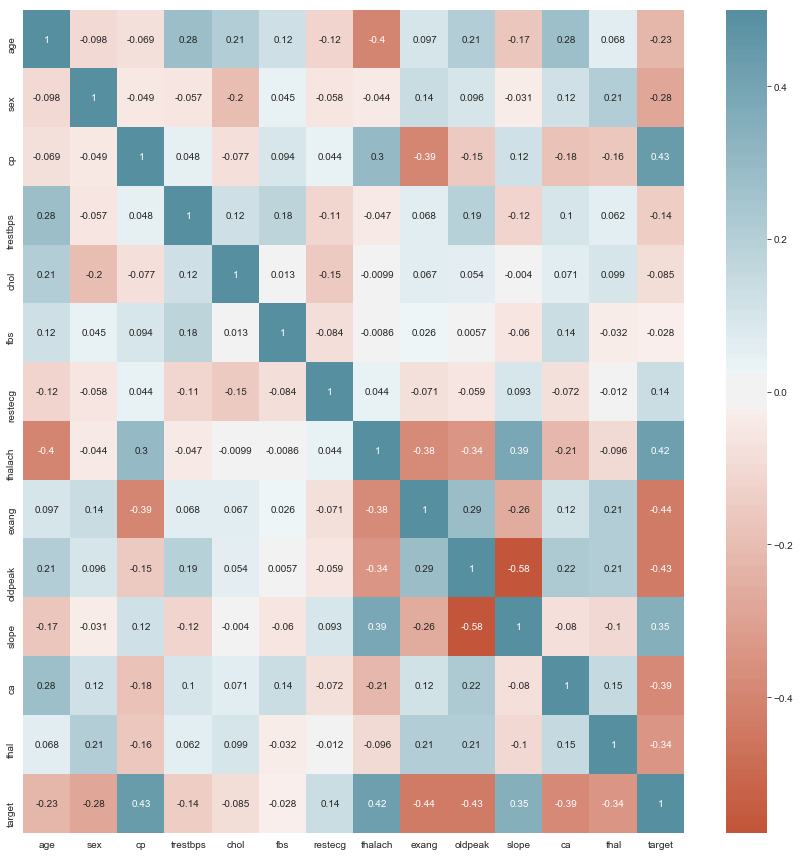

In [58]:
plt.figure(figsize=(12,12))   # set up the figure 
corr = data.corr()             # compute the correlation matrix
sns.heatmap(                  # plot the heatmap
    corr, 
    annot=True, 
    vmax=.5, 
    center=0,
    cmap=sns.diverging_palette(20, 220, n=200)
) 
plt.tight_layout()
plt.show()

The dataset contains categorical and numeric features separately, with many columns. The correlation matrix can be visualized as a heatmap to detect correlations between columns. After computing the pairwise correlation of them, excluding empty values, it is evident that the relationship between the target value and other values is very high. 

In [59]:
# data.hist()
# sns.pairplot(data, hue="target")
# plt.show()

## 4.2  Feature Importance

There are some vital features and insignificant features. The goal of this step is to find out the importance of the feature.

In [60]:
import eli5
from eli5.sklearn import PermutationImportance

In [61]:
perm = PermutationImportance(rfc, random_state=1).fit(x_test, y_test)
eli5.show_weights(perm, feature_names = dt.drop('target', 1).columns.tolist())

Weight,Feature
0.0262 ± 0.0334,num_major_vessels
0.0262 ± 0.0445,chest_pain_type_atypical angina
0.0230 ± 0.0491,st_slope_upsloping
0.0197 ± 0.0245,st_slope_flat
0.0131 ± 0.0131,chest_pain_type_non-anginal pain
0.0098 ± 0.0161,thalassemia_reversable defect
0.0066 ± 0.0334,thalassemia_fixed defect
0.0033 ± 0.0636,st_depression
0.0033 ± 0.0131,age
0.0000 ± 0.0207,rest_ecg_normal


In [62]:
from pdpbox import pdp, info_plots
x = dt.drop('target', 1)
y = dt['target']
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.20, random_state=10) 

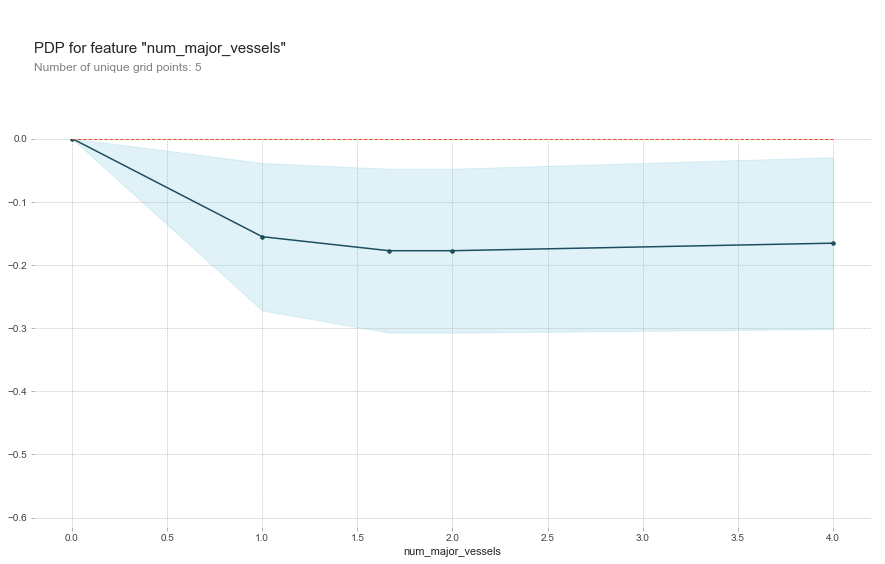

In [63]:
# num_major_vessels
fs_name = dt.drop('target', 1).columns.tolist()
feature_name = 'num_major_vessels'
pdp_dist = pdp.pdp_isolate(model=rfc, dataset=x_test, model_features=fs_name, feature= feature_name)
# plot it
pdp.pdp_plot(pdp_dist, feature_name)
plt.show()

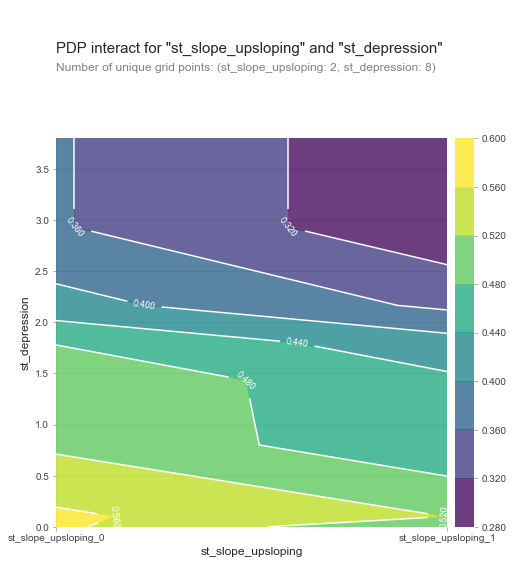

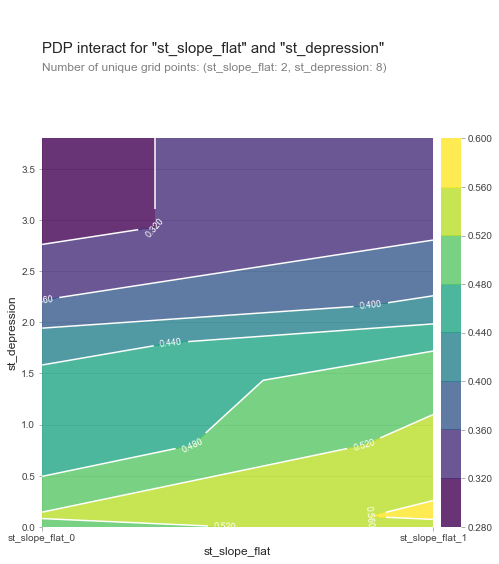

In [64]:
# Similar to previous PDP plot except we use pdp_interact instead of pdp_isolate and pdp_interact_plot instead of pdp_isolate_plot
features_to_plot1 = ['st_slope_upsloping', 'st_depression']
inter1  =  pdp.pdp_interact(model=rfc, dataset=x_test, model_features=fs_name, features=features_to_plot1)
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot1, plot_type='contour')
plt.show()

features_to_plot2 = ['st_slope_flat', 'st_depression']
inter1  =  pdp.pdp_interact(model=rfc, dataset=x_test, model_features=fs_name, features=features_to_plot2)
pdp.pdp_interact_plot(pdp_interact_out=inter1, feature_names=features_to_plot2, plot_type='contour')
plt.show()

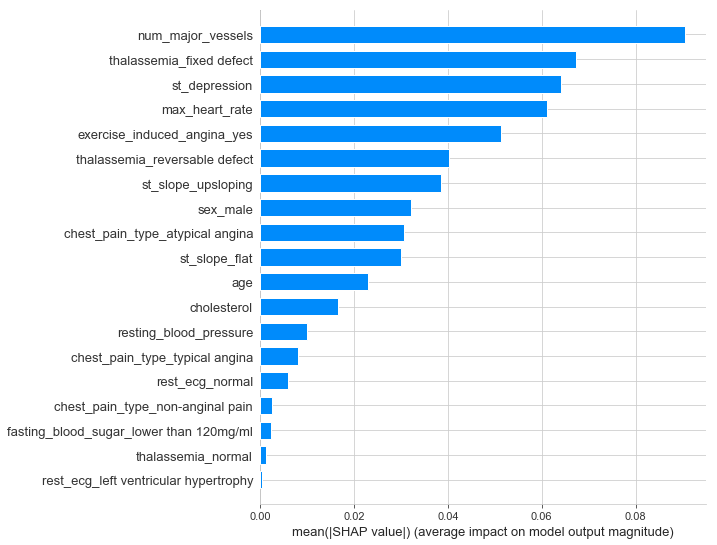

In [65]:
import shap  # package used to calculate Shap values

# Create object that can calculate shap values
explainer = shap.TreeExplainer(rfc)

# Calculate Shap values
shap_values = explainer.shap_values(x_test)

shap.summary_plot(shap_values[1], x_test, plot_type="bar") #  SHAP values for positive outcomes (pulling out shap_values[1]).

In [73]:
# shap_values[1].shape (50,19)

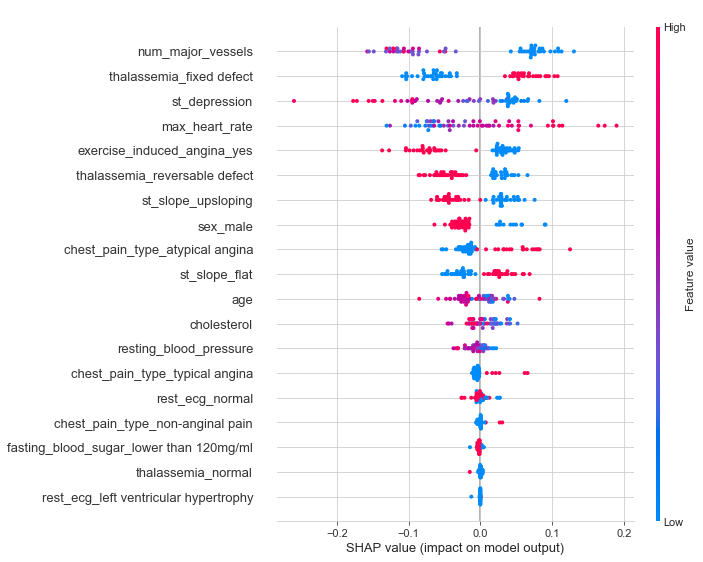

In [66]:
shap.summary_plot(shap_values[1], x_test)

In [67]:
def heart_disease_risk_factors(model, patient):

    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(patient)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], shap_values[1], patient)

In [68]:
data_for_prediction = x_test.iloc[1,:].astype(float)
heart_disease_risk_factors(rfc, data_for_prediction)

In [69]:
data_for_prediction = x_test.iloc[3,:].astype(float)
heart_disease_risk_factors(rfc, data_for_prediction)

In [70]:
shap_values = explainer.shap_values(x_train.iloc[:50])
shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[:50])